### Imports

In [ ]:
import torch
import torch.nn as nn

import torchvision
import torchvision.transforms as transforms

from tqdm.notebook import tqdm

import matplotlib.pyplot as plt

In [ ]:
import numpy as np
from math import ceil, sqrt

def show_images(images, labels=None, title=None, transform=None, figsize=(12, 12)):
    fig = plt.figure(figsize=figsize, linewidth=5)
    grid_val = ceil(sqrt(len(images)))
    grid_specs = plt.GridSpec(grid_val, grid_val)
    
    for i, image in enumerate(images):
        ax = fig.add_subplot(grid_specs[i // grid_val, i % grid_val])
        ax.axis('off')
        
        if transform is not None:
            image = transform(image)
        
        if labels is not None:
            ax_title = labels[i]
        else:
            ax_title = '#{}'.format(i+1)
            
        ax.set_title(ax_title)
        ax.imshow(image, cmap='gray')
            
    if title:
        fig.suptitle(title, y=0.93, fontsize='xx-large')
    plt.show()

In [ ]:
num_workers = 2
batch_size = 256

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using {} device'.format(device))

Using cuda device


### Data loading

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        (0.5,), (0.5,))
    ])

transform = transforms.Compose([
    transforms.ToTensor()
])

train_data = torchvision.datasets.FashionMNIST(
    root='./data', train=True, download=True, 
    transform=transform
)

test_data = torchvision.datasets.FashionMNIST(
    root='./data', train=False, download=True, 
    transform=transform
)

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



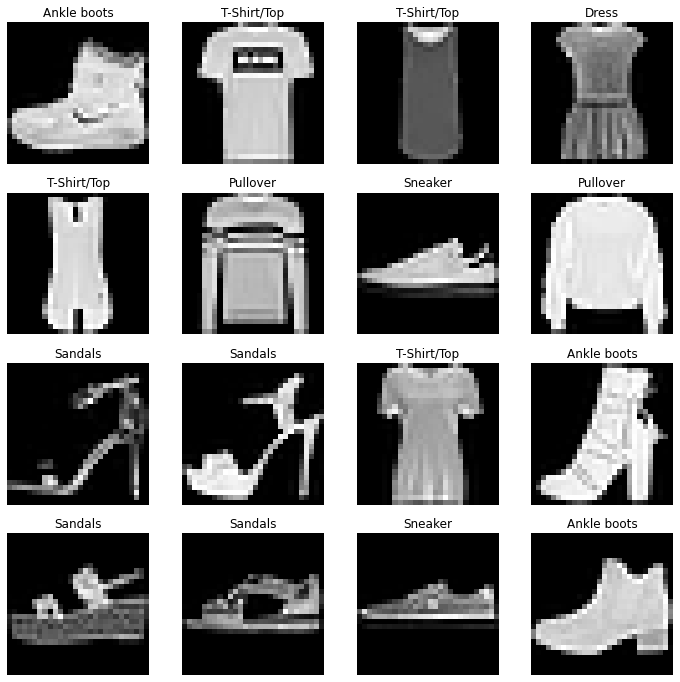

In [ ]:
train_dataloader = torch.utils.data.DataLoader(
    train_data, shuffle=False, 
    batch_size=batch_size, num_workers=num_workers
)

test_dataloader = torch.utils.data.DataLoader(
    test_data, shuffle=False, 
    batch_size=batch_size, num_workers=num_workers
)

labels_map = {
    0: "T-Shirt/Top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandals",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle boots",
}

N_samples = 16
images, labels = next(iter(train_dataloader))
show_images(
    images[:N_samples], 
    [labels_map[i.item()] for i in labels[:N_samples]], 
    transform=transforms.ToPILImage()
)

### Train and test loops

In [ ]:
import IPython
from IPython.display import clear_output

def train_loop(model, dataloader, loss_fn, optimizer, step=0.05):
    out = display(IPython.display.Pretty('Learning...'), display_id=True)

    size = 0
    train_loss, correct = 0, 0
    batches = 0

    percentage = 0
    for batch, (X, y) in enumerate(tqdm(dataloader, leave=False, desc="Batch #")):
        X, y = X.to(device), y.to(device)

        pred = model(X) * mask
        mask_idx = torch.as_tensor([bool(mask[elem]) for elem in y])
        y, pred = y[mask_idx], pred[mask_idx]

        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        correct += (pred.argmax(1) == y).type(torch.float).sum().item()

        size += len(y)
        batches += 1

        # if batch / batches > percentage or batch == batches: 
        #     out.update(f'[{int(percentage * size)}/{size}] Loss: {loss:>8f}')
        #     percentage += step

    train_loss /= batches
    correct /= size

    history['train_loss'].append(train_loss)
    history['train_acc'].append(correct)

    return history
        
        
def test_loop(model, dataloader, loss_fn):
    size = 0
    test_loss, correct = 0, 0
    batches = 0


    with torch.no_grad():
        for batch, (X, y) in enumerate(tqdm(dataloader, leave=False, desc="Batch #")):
            X, y = X.to(device), y.to(device)

            pred = model(X) * mask
            mask_idx = torch.as_tensor([bool(mask[elem]) for elem in y])
            y, pred = y[mask_idx], pred[mask_idx]

            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            size += len(y)
            batches += 1

    test_loss /= batches
    correct /= size

    history['val_loss'].append(test_loss)
    history['val_acc'].append(correct)

    print(f"Validation accuracy: {(100*correct):>0.1f}%, Validation loss: {test_loss:>8f} \n")
    return history

### Model - multilayer perceptron

In [ ]:
class MLP(nn.Module):
    def __init__(self, in_shape, n_classes=10, blocks=[32, 64, 32]):
        super().__init__()

        in_features = [np.prod(in_shape), *blocks]
        out_features = [*blocks, n_classes]
        
        self.flatten = nn.Flatten()

        self.stack = nn.Sequential(*[
            nn.Sequential(
                nn.Linear(in_features[idx], out_features[idx]),
                nn.ReLU(),
            )
            for idx in range(len(blocks) + 1)
        ])
        
        
    def forward(self, X):
        return self.stack(self.flatten(X))

### Teacher models training

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

num_repeats = 10
epochs = 50

for i in range(num_repeats):
    clear_output()

    print(f"Model {i+1}\n-------------------------------"
                      "\n-------------------------------")

    torch.manual_seed(i)

    model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[128, 64, 32]).to(device)
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}\n-------------------------------")

        train_loop(model, train_dataloader, loss_fn, optimizer)
        test_loop(model, test_dataloader, loss_fn)

    torch.save(model.state_dict(), f'/content/drive/MyDrive/models/teacher_{i}.pt')

Model 10
-------------------------------
-------------------------------
Epoch 1
-------------------------------


'[60000/60000] Loss: 1.239650'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 62.3%, Validation loss: 1.213690 

Epoch 2
-------------------------------


'[60000/60000] Loss: 0.933906'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 68.1%, Validation loss: 0.939787 

Epoch 3
-------------------------------


'[60000/60000] Loss: 0.831241'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 72.5%, Validation loss: 0.835257 

Epoch 4
-------------------------------


'[60000/60000] Loss: 0.784287'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.2%, Validation loss: 0.774973 

Epoch 5
-------------------------------


'[60000/60000] Loss: 0.767163'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 75.2%, Validation loss: 0.738539 

Epoch 6
-------------------------------


'[60000/60000] Loss: 0.757226'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 76.0%, Validation loss: 0.714159 

Epoch 7
-------------------------------


'[60000/60000] Loss: 0.750853'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 76.4%, Validation loss: 0.697249 

Epoch 8
-------------------------------


'[60000/60000] Loss: 0.745241'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 76.8%, Validation loss: 0.684757 

Epoch 9
-------------------------------


'[60000/60000] Loss: 0.739965'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 77.1%, Validation loss: 0.674854 

Epoch 10
-------------------------------


'[60000/60000] Loss: 0.734562'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 77.3%, Validation loss: 0.666486 

Epoch 11
-------------------------------


'[60000/60000] Loss: 0.729623'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 77.5%, Validation loss: 0.659389 

Epoch 12
-------------------------------


'[60000/60000] Loss: 0.722410'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 77.7%, Validation loss: 0.652796 

Epoch 13
-------------------------------


'[60000/60000] Loss: 0.714669'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 77.9%, Validation loss: 0.646897 

Epoch 14
-------------------------------


'[60000/60000] Loss: 0.706838'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.0%, Validation loss: 0.641599 

Epoch 15
-------------------------------


'[60000/60000] Loss: 0.700244'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.1%, Validation loss: 0.636714 

Epoch 16
-------------------------------


'[60000/60000] Loss: 0.693756'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.2%, Validation loss: 0.632312 

Epoch 17
-------------------------------


'[60000/60000] Loss: 0.687051'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.5%, Validation loss: 0.628132 

Epoch 18
-------------------------------


'[60000/60000] Loss: 0.679874'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.5%, Validation loss: 0.624229 

Epoch 19
-------------------------------


'[60000/60000] Loss: 0.672766'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.7%, Validation loss: 0.620843 

Epoch 20
-------------------------------


'[60000/60000] Loss: 0.666979'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.7%, Validation loss: 0.617932 

Epoch 21
-------------------------------


'[60000/60000] Loss: 0.661593'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 78.8%, Validation loss: 0.614955 

Epoch 22
-------------------------------


'[60000/60000] Loss: 0.655528'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.0%, Validation loss: 0.611957 

Epoch 23
-------------------------------


'[60000/60000] Loss: 0.648292'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.0%, Validation loss: 0.609127 

Epoch 24
-------------------------------


'[60000/60000] Loss: 0.642931'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.1%, Validation loss: 0.606614 

Epoch 25
-------------------------------


'[60000/60000] Loss: 0.637782'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.3%, Validation loss: 0.604200 

Epoch 26
-------------------------------


'[60000/60000] Loss: 0.633143'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.5%, Validation loss: 0.601882 

Epoch 27
-------------------------------


'[60000/60000] Loss: 0.628077'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.5%, Validation loss: 0.599627 

Epoch 28
-------------------------------


'[60000/60000] Loss: 0.623463'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.6%, Validation loss: 0.597638 

Epoch 29
-------------------------------


'[60000/60000] Loss: 0.618675'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.7%, Validation loss: 0.595830 

Epoch 30
-------------------------------


'[60000/60000] Loss: 0.614364'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.7%, Validation loss: 0.594103 

Epoch 31
-------------------------------


'[60000/60000] Loss: 0.610719'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.8%, Validation loss: 0.592412 

Epoch 32
-------------------------------


'[60000/60000] Loss: 0.606783'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.8%, Validation loss: 0.590767 

Epoch 33
-------------------------------


'[60000/60000] Loss: 0.603138'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.9%, Validation loss: 0.589192 

Epoch 34
-------------------------------


'[60000/60000] Loss: 0.599448'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.9%, Validation loss: 0.587732 

Epoch 35
-------------------------------


'[60000/60000] Loss: 0.595604'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 79.9%, Validation loss: 0.586205 

Epoch 36
-------------------------------


'[60000/60000] Loss: 0.591506'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.0%, Validation loss: 0.584732 

Epoch 37
-------------------------------


'[60000/60000] Loss: 0.586809'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.0%, Validation loss: 0.583191 

Epoch 38
-------------------------------


'[60000/60000] Loss: 0.583148'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.1%, Validation loss: 0.581793 

Epoch 39
-------------------------------


'[60000/60000] Loss: 0.579082'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.1%, Validation loss: 0.580581 

Epoch 40
-------------------------------


'[60000/60000] Loss: 0.575144'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.1%, Validation loss: 0.579270 

Epoch 41
-------------------------------


'[60000/60000] Loss: 0.571503'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.578175 

Epoch 42
-------------------------------


'[60000/60000] Loss: 0.567623'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.577111 

Epoch 43
-------------------------------


'[60000/60000] Loss: 0.564980'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.576162 

Epoch 44
-------------------------------


'[60000/60000] Loss: 0.561522'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.574952 

Epoch 45
-------------------------------


'[60000/60000] Loss: 0.559175'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.573977 

Epoch 46
-------------------------------


'[60000/60000] Loss: 0.556504'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.573152 

Epoch 47
-------------------------------


'[60000/60000] Loss: 0.553828'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.572217 

Epoch 48
-------------------------------


'[60000/60000] Loss: 0.551181'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.571346 

Epoch 49
-------------------------------


'[60000/60000] Loss: 0.548836'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.2%, Validation loss: 0.570508 

Epoch 50
-------------------------------


'[60000/60000] Loss: 0.546398'

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 80.1%, Validation loss: 0.569708 



In [ ]:
def plot_history():
    x = np.arange(1, epochs * num_repeats + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, figsize=(20, 10))
    ax1.plot(x, history['train_loss'], label='Train')
    ax1.plot(x, history['val_loss'], label='Val')
    ax1.set_title('Loss', fontsize=16)
    ax1.legend(fontsize=14)

    ax2.plot(x, history['train_acc'], label='Train')
    ax2.plot(x, history['val_acc'], label='Val')
    ax2.set_title('Accuracy', fontsize=16)
    ax2.legend(fontsize=14)

    fig.text(0.5, 0.04, 'Epoch', ha='center', fontsize=14)

    plt.show()

### Plots quality stats for debug (every 10 epochs on the plot training a new model)

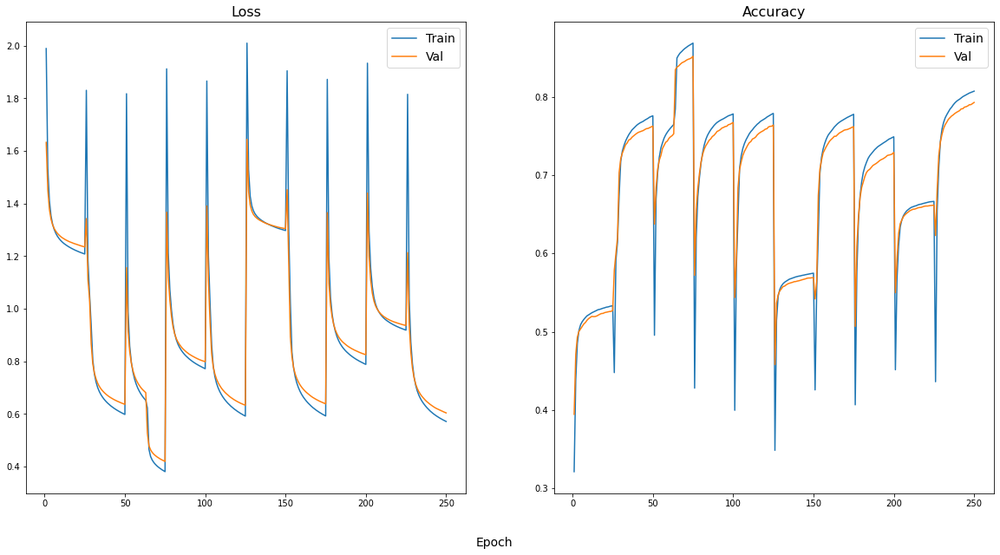

In [ ]:
plot_history()

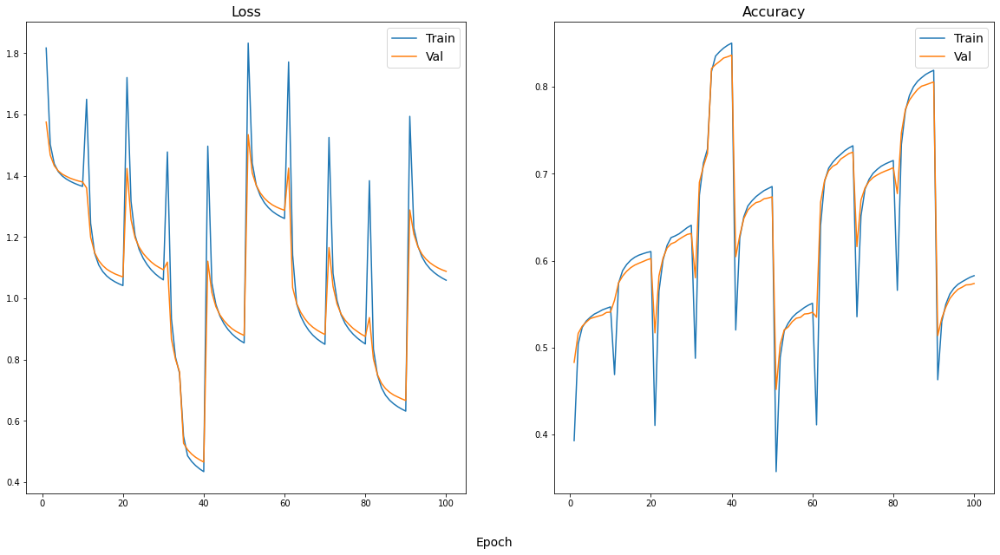

In [ ]:
plot_history()

In [ ]:
model

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (stack): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=128, bias=True)
      (1): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=64, bias=True)
      (1): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): ReLU()
    )
    (3): Sequential(
      (0): Linear(in_features=32, out_features=10, bias=True)
      (1): ReLU()
    )
  )
)

In [ ]:
nn.init.uniform_(model.stack[0][0].weight, -1, 1)

model.stack[0][0].weight

Parameter containing:
tensor([[-0.1412,  0.2367,  0.4801,  ...,  0.1588, -0.4143,  0.1267],
        [ 0.2898,  0.4407,  0.5158,  ...,  0.4501, -0.9381, -0.3429],
        [ 0.9798,  0.0036, -0.2453,  ...,  0.4628, -0.2894, -0.2666],
        ...,
        [-0.4847, -0.5034, -0.8749,  ...,  0.3663,  0.0335,  0.7236],
        [ 0.7200,  0.1952, -0.8635,  ...,  0.6021,  0.5501,  0.7289],
        [ 0.6425, -0.5038,  0.9229,  ...,  0.3689,  0.1359,  0.6919]],
       device='cuda:0', requires_grad=True)

### Code for weight extention for this particular case

`TODO` more general case

In [ ]:
def change_weights(student_model, teacher_model, mode):
    if mode not in ['zero', 'uniform']:
        return 

    student_model.stack[0][0].weight = nn.Parameter(teacher_model.stack[0][0].weight)
    student_model.stack[0][0].bias = nn.Parameter(teacher_model.stack[0][0].bias)

    if mode == 'zero':
        student_model.stack[1][0].weight = nn.Parameter(torch.cat((teacher_model.stack[1][0].weight,
                                                                   torch.zeros(64, 128).to(device))))
        student_model.stack[1][0].bias = nn.Parameter(torch.cat((teacher_model.stack[1][0].bias,
                                                                 torch.zeros(64).to(device))))
        
        student_model.stack[2][0].weight = nn.Parameter(torch.cat((teacher_model.stack[2][0].weight,
                                                                   torch.zeros(32, 64).to(device)), dim=1))
    elif mode == 'uniform':
        student_model.stack[1][0].weight = nn.Parameter(torch.cat((teacher_model.stack[1][0].weight,
                                                                   student_model.stack[1][0].weight[64:])))
        student_model.stack[1][0].bias = nn.Parameter(torch.cat((teacher_model.stack[1][0].bias,
                                                                 student_model.stack[1][0].bias[64:])))
        
        student_model.stack[2][0].weight = nn.Parameter(torch.cat((teacher_model.stack[2][0].weight,
                                                                   student_model.stack[2][0].weight[:, 64:]), dim=1))

    student_model.stack[2][0].bias = nn.Parameter(teacher_model.stack[2][0].bias)

    student_model.stack[3][0].weight = nn.Parameter(teacher_model.stack[3][0].weight)
    student_model.stack[3][0].bias = nn.Parameter(teacher_model.stack[3][0].bias)

In [ ]:
def train(model, optimizer):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}\n-------------------------------")

        train_loop(model, train_dataloader, loss_fn, optimizer)
        test_loop(model, test_dataloader, loss_fn)

### Code for training models with different kinds of initialization

In [ ]:
scratch_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
zero_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
uniform_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

epochs = 10
num_repeats = 10
loss_fn = nn.CrossEntropyLoss()

for i in range(num_repeats):
    clear_output()

    torch.manual_seed(i + num_repeats)

    print(f"Scratch model {i+1}\n-------------------------------"
                              "\n-------------------------------")

    scratch_model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[256, 128, 64]).to(device)
    optimizer = torch.optim.Adam(scratch_model.parameters(), lr=1e-4)

    history = scratch_history
    train(scratch_model, optimizer)
    clear_output()

    print(f"Student model zero {i+1}\n-------------------------------"
                              "\n-------------------------------")

    teacher_model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[128, 64, 32]).to(device)
    teacher_model.load_state_dict(torch.load(f'/content/drive/MyDrive/models/teacher_{i}.pt'))

    student_model_zero = MLP(images[0].shape, n_classes=len(labels_map), blocks=[256, 128, 64]).to(device)
    change_weights(student_model_zero, teacher_model, 'zero')
    optimizer = torch.optim.Adam(student_model_zero.parameters(), lr=1e-4)

    history = zero_history
    train(student_model_zero, optimizer)
    
    clear_output()

    print(f"Student model uniform {i+1}\n-------------------------------"
                              "\n-------------------------------")

    torch.manual_seed(i + num_repeats)

    student_model_uni = MLP(images[0].shape, n_classes=len(labels_map), blocks=[256, 128, 64]).to(device)
    change_weights(student_model_uni, teacher_model, 'uniform')
    optimizer = torch.optim.Adam(student_model_uni.parameters(), lr=1e-4)

    history = uniform_history
    train(student_model_uni, optimizer)

### For plotting results

In [ ]:
def plot_variance(histories, labels, field_name, epoch_size, xlabel='', ylabel='', filename='file', type='std'):
    plt.rcParams['font.family'] = 'DejaVu Serif'
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['lines.markersize'] = 12
    plt.rcParams['xtick.labelsize'] = 24
    plt.rcParams['ytick.labelsize'] = 24
    plt.rcParams['legend.fontsize'] = 24
    plt.rcParams['axes.titlesize'] = 36
    plt.rcParams['axes.labelsize'] = 24

    x = np.arange(1, epoch_size + 1)

    plt.figure(figsize=(12, 10))

    for history, label in zip(histories, labels):
        data = torch.Tensor(history[field_name]).reshape(-1, epoch_size)
        if type == 'std':
            print(len(data.mean(axis=0)), len(x))
            plt.plot(x, data.mean(axis=0).values, label=label)
            plt.fill_between(x, data.std(axis=0).values, data.std(axis=0).values, alpha=0.3)
        elif type == 'q':
            plt.plot(x, torch.median(data, axis=0).values, label=label)
            plt.fill_between(x, data.min(axis=0).values, data.max(axis=0).values, alpha=0.3)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.savefig(f'{filename}.eps', transparent=True)
    plt.savefig(f'{filename}.png')
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


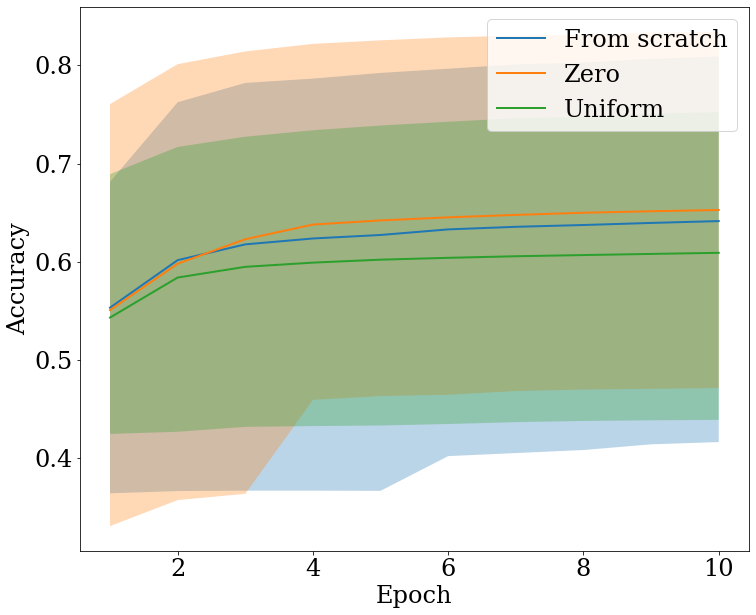

In [ ]:
plot_variance([scratch_history, zero_history, uniform_history], ['From scratch', 'Zero', 'Uniform'], 'val_acc', 10, 'Epoch', 'Accuracy', 'accuracy')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


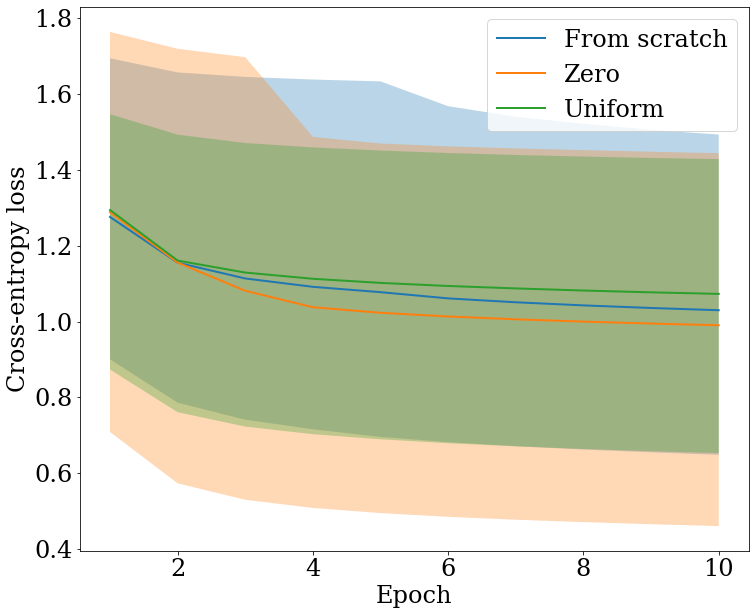

In [ ]:
plot_variance([scratch_history, zero_history, uniform_history], ['From scratch', 'Zero', 'Uniform'], 'val_loss', 10, 'Epoch', 'Cross-entropy loss', 'loss')

### Train teacher models on 5 classes

In [ ]:
# classes 0 to 4

mask = torch.tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 0], dtype=torch.float).to(device)

history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

num_repeats = 5
epochs = 30

loss_fn = nn.CrossEntropyLoss(weight=mask)

for i in range(num_repeats):
    clear_output()

    print(f"Model {i+1}\n-------------------------------"
                      "\n-------------------------------")

    torch.manual_seed(i)

    model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[128, 64, 32]).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}\n-------------------------------")

        train_loop(model, train_dataloader, loss_fn, optimizer)
        test_loop(model, test_dataloader, loss_fn)

    torch.save(model.state_dict(), f'/content/drive/MyDrive/models/teacher_5cl_{i}.pt')

Model 5
-------------------------------
-------------------------------
Epoch 1
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 69.9%, Validation loss: 1.114829 

Epoch 2
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 72.0%, Validation loss: 0.890437 

Epoch 3
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.1%, Validation loss: 0.834311 

Epoch 4
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.6%, Validation loss: 0.810975 

Epoch 5
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.8%, Validation loss: 0.798334 

Epoch 6
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.0%, Validation loss: 0.789641 

Epoch 7
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.2%, Validation loss: 0.783046 

Epoch 8
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.2%, Validation loss: 0.777857 

Epoch 9
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.4%, Validation loss: 0.773509 

Epoch 10
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.4%, Validation loss: 0.769588 

Epoch 11
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.6%, Validation loss: 0.766069 

Epoch 12
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.762927 

Epoch 13
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.760117 

Epoch 14
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.757590 

Epoch 15
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.7%, Validation loss: 0.755248 

Epoch 16
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.7%, Validation loss: 0.753037 

Epoch 17
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.751026 

Epoch 18
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.7%, Validation loss: 0.749301 

Epoch 19
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.747574 

Epoch 20
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.745952 

Epoch 21
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.9%, Validation loss: 0.744220 

Epoch 22
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.9%, Validation loss: 0.742836 

Epoch 23
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.9%, Validation loss: 0.741575 

Epoch 24
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.9%, Validation loss: 0.740580 

Epoch 25
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.9%, Validation loss: 0.739726 

Epoch 26
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.738610 

Epoch 27
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.737598 

Epoch 28
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.736535 

Epoch 29
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.735722 

Epoch 30
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.8%, Validation loss: 0.734403 



In [ ]:
scratch_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
uniform_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

epochs = 30
num_repeats = 5
loss_fn = nn.CrossEntropyLoss()

mask = torch.ones(10).to(device)

for i in range(num_repeats):
    clear_output()

    torch.manual_seed(i + num_repeats)

    print(f"Scratch model {i+1}\n-------------------------------"
                              "\n-------------------------------")

    scratch_model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[256, 128, 64]).to(device)
    optimizer = torch.optim.Adam(scratch_model.parameters(), lr=1e-4)

    history = scratch_history
    train(scratch_model, optimizer)
    clear_output()

    teacher_model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[128, 64, 32]).to(device)
    teacher_model.load_state_dict(torch.load(f'/content/drive/MyDrive/models/teacher_5cl_{i}.pt'))

    print(f"Student model uniform {i+1}\n-------------------------------"
                              "\n-------------------------------")

    torch.manual_seed(i + num_repeats)

    student_model_uni = MLP(images[0].shape, n_classes=len(labels_map), blocks=[128, 128, 32]).to(device)
    change_weights(student_model_uni, teacher_model, 'uniform')
    optimizer = torch.optim.Adam(student_model_uni.parameters(), lr=1e-4)

    history = uniform_history
    train(student_model_uni, optimizer)

Student model uniform 5
-------------------------------
-------------------------------
Epoch 1
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 62.2%, Validation loss: 1.332346 

Epoch 2
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 63.7%, Validation loss: 1.155454 

Epoch 3
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 64.1%, Validation loss: 1.096959 

Epoch 4
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 64.3%, Validation loss: 1.069042 

Epoch 5
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 67.1%, Validation loss: 1.035353 

Epoch 6
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 72.0%, Validation loss: 0.868352 

Epoch 7
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 72.6%, Validation loss: 0.830074 

Epoch 8
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 72.9%, Validation loss: 0.812029 

Epoch 9
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.2%, Validation loss: 0.800689 

Epoch 10
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.2%, Validation loss: 0.792039 

Epoch 11
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.5%, Validation loss: 0.784624 

Epoch 12
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.7%, Validation loss: 0.779439 

Epoch 13
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.8%, Validation loss: 0.774480 

Epoch 14
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.8%, Validation loss: 0.770713 

Epoch 15
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 73.9%, Validation loss: 0.767071 

Epoch 16
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.0%, Validation loss: 0.763978 

Epoch 17
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.0%, Validation loss: 0.761209 

Epoch 18
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.1%, Validation loss: 0.758482 

Epoch 19
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.2%, Validation loss: 0.756013 

Epoch 20
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.2%, Validation loss: 0.753703 

Epoch 21
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.3%, Validation loss: 0.751166 

Epoch 22
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.3%, Validation loss: 0.749436 

Epoch 23
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.3%, Validation loss: 0.747422 

Epoch 24
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.3%, Validation loss: 0.745855 

Epoch 25
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.4%, Validation loss: 0.744260 

Epoch 26
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.5%, Validation loss: 0.742604 

Epoch 27
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.5%, Validation loss: 0.741057 

Epoch 28
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.5%, Validation loss: 0.739590 

Epoch 29
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.6%, Validation loss: 0.738430 

Epoch 30
-------------------------------


Learning...

Batch #:   0%|          | 0/235 [00:00<?, ?it/s]

Batch #:   0%|          | 0/40 [00:00<?, ?it/s]

Validation accuracy: 74.6%, Validation loss: 0.737039 



ValueError: ignored

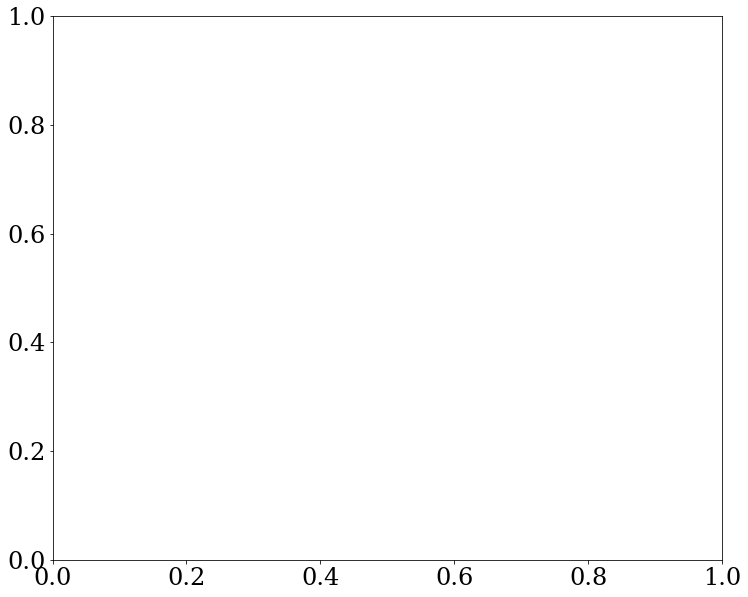

In [ ]:
plot_variance([scratch_history, uniform_history], ['From scratch', '$\lambda_2$=1'], 'val_loss', 5, 'Epoch', 'Cross-entropy loss', 'loss')

In [ ]:
def plot_variance(histories, labels, field_name, epoch_size, xlabel='', ylabel='', filename='file', plot_type='std'):
    plt.rcParams['font.family'] = 'DejaVu Serif'
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['lines.markersize'] = 12
    plt.rcParams['xtick.labelsize'] = 24
    plt.rcParams['ytick.labelsize'] = 24
    plt.rcParams['legend.fontsize'] = 24
    plt.rcParams['axes.titlesize'] = 36
    plt.rcParams['axes.labelsize'] = 24

    x = np.arange(1, epoch_size + 1)

    plt.figure(figsize=(12, 10))

    for history, label in zip(histories, labels):
        data = torch.Tensor(history[field_name]).reshape(-1, epoch_size)
        if plot_type == 'std':
            data_mean = data.mean(axis=0)
            data_std = data.std(axis=0)
            print(x)
            print(data_mean)
            plt.plot(x, data_mean, label=label)
            plt.fill_between(x, data_mean - data_std, data_mean + data_std, alpha=0.3)
        elif plot_type == 'q':
            plt.plot(x, torch.median(data, axis=0), label=label)
            plt.fill_between(x, data.min(axis=0), data.max(axis=0).values, alpha=0.3)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.savefig(f'{filename}.eps', transparent=True)
    plt.savefig(f'{filename}.png')
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]
tensor([0.5329, 0.5809, 0.5963, 0.6035, 0.6085, 0.6118, 0.6147, 0.6167, 0.6184,
        0.6201, 0.6214, 0.6226, 0.6237, 0.6246, 0.6252, 0.6262, 0.6269, 0.6277,
        0.6289, 0.6296, 0.6300, 0.6302, 0.6309, 0.6311, 0.6316, 0.6322, 0.6325,
        0.6332, 0.6334, 0.6338])
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]
tensor([0.6071, 0.6690, 0.7123, 0.7252, 0.7367, 0.7511, 0.7548, 0.7579, 0.7602,
        0.7624, 0.7644, 0.7663, 0.7677, 0.7686, 0.7694, 0.7706, 0.7715, 0.7720,
        0.7726, 0.7734, 0.7739, 0.7747, 0.7753, 0.7757, 0.7762, 0.7768, 0.7771,
        0.7773, 0.7779, 0.7782])


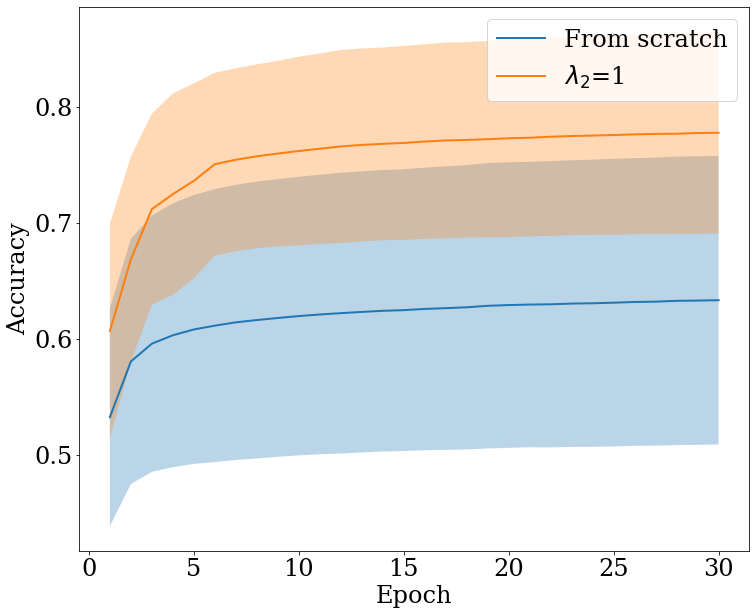

In [ ]:
plot_variance([scratch_history, uniform_history], ['From scratch', '$\lambda_2$=1'], 'val_acc', 30, 'Epoch', 'Accuracy', 'acc')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]
tensor([1.3413, 1.1848, 1.1308, 1.1041, 1.0859, 1.0728, 1.0626, 1.0544, 1.0475,
        1.0414, 1.0364, 1.0318, 1.0280, 1.0241, 1.0205, 1.0175, 1.0148, 1.0120,
        1.0097, 1.0074, 1.0052, 1.0034, 1.0014, 0.9996, 0.9980, 0.9964, 0.9951,
        0.9936, 0.9921, 0.9907])
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]
tensor([1.2216, 0.9891, 0.8714, 0.8053, 0.7668, 0.7149, 0.6944, 0.6809, 0.6710,
        0.6632, 0.6565, 0.6509, 0.6462, 0.6421, 0.6384, 0.6352, 0.6322, 0.6295,
        0.6270, 0.6247, 0.6225, 0.6205, 0.6186, 0.6168, 0.6152, 0.6136, 0.6121,
        0.6107, 0.6093, 0.6079])


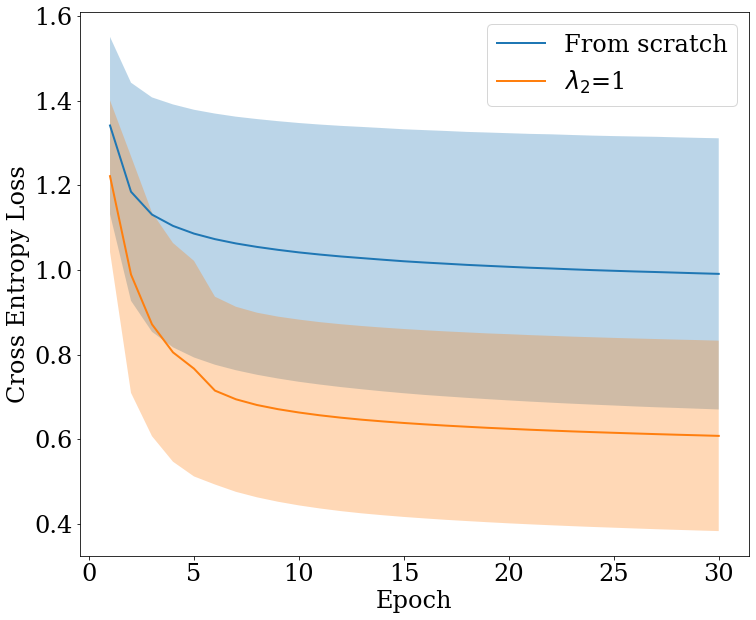

In [ ]:
plot_variance([scratch_history, uniform_history], ['From scratch', '$\lambda_2$=1'], 'val_loss', 30, 'Epoch', 'Cross Entropy Loss', 'loss')